In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import glob

In [3]:
def plotar(img, figsize=(10,10)):
    try:
        channel = img.shape[2]
    except:
        channel = 1
    plt.figure(figsize=figsize)
    if channel == 1:
        plt.imshow(img, cmap='gray')
    elif channel == 3:
        plt.imshow(img)

def laplaciano(src, kernel_size=(3,3)):
    src = cv2.GaussianBlur(src, kernel_size, 0)
    src_gray = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)
    ddepth = cv2.CV_16S
    kernel_size = 3
    dst = cv2.Laplacian(src_gray, ddepth, ksize=kernel_size)
    abs_dst = cv2.convertScaleAbs(dst)
    return abs_dst

## As imagens utilizadas nesse notebook estão disponível em : 
[Link para as imagens no github](https://github.com/pedrodsk/pdi/tree/master/imgs_pdi)
* Atenção a cédula abaixo para a posição das imagens, um nível anterior ao notebook e na pasta imgs_pdi

In [4]:
imgs_list = glob.glob('../imgs_pdi/*')

In [5]:
imgs_list.sort()

In [6]:
for img in enumerate(imgs_list):
    print(img)

(0, '../imgs_pdi/aorta.jpg')
(1, '../imgs_pdi/cubo_magico.jpg')
(2, '../imgs_pdi/fpb.png')
(3, '../imgs_pdi/hsv_python.png')
(4, '../imgs_pdi/joelho.jpg')
(5, '../imgs_pdi/leao.jpeg')
(6, '../imgs_pdi/limao_amarelo.jpg')
(7, '../imgs_pdi/moedas04.jpg')
(8, '../imgs_pdi/montanha.jpg')
(9, '../imgs_pdi/paisagem.jpg')
(10, '../imgs_pdi/pedestres02.jpg')
(11, '../imgs_pdi/pelagem.jpg')
(12, '../imgs_pdi/pre-historia01.jpeg')
(13, '../imgs_pdi/pre-historia02.jpeg')
(14, '../imgs_pdi/psicopata.jpg')
(15, '../imgs_pdi/rainbow-fruits.jpg')


## Escolha o número da imagem : 

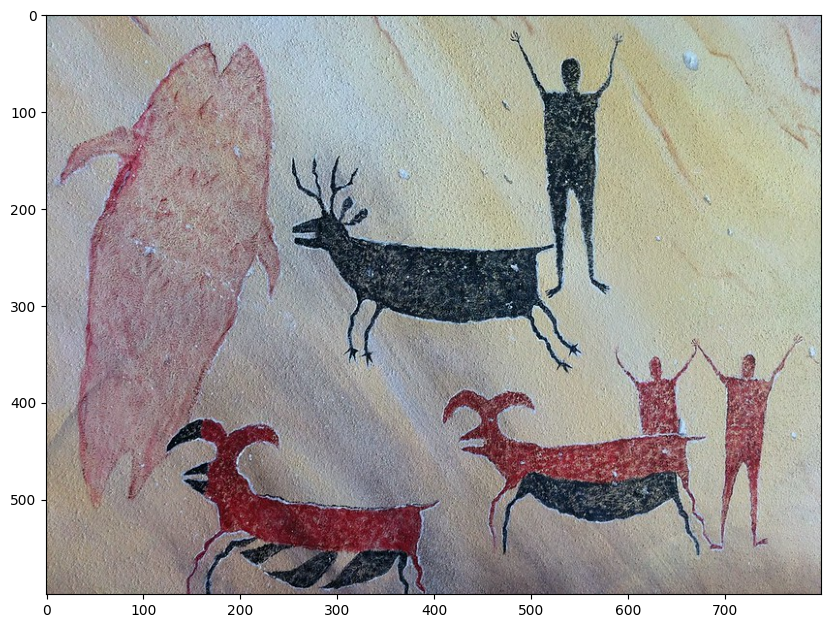

In [7]:
img_path = imgs_list[12]

img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plotar(img_rgb)

# Laplaciano

In [8]:
img_laplaciano = laplaciano(img, kernel_size=(7,7))

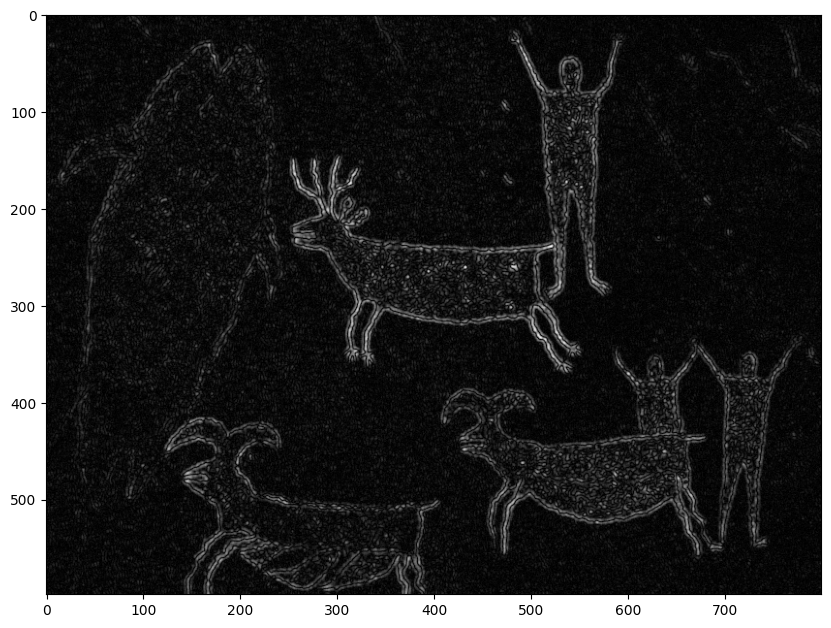

In [9]:
plotar(img_laplaciano, figsize=(10,13))

# Dilatação

In [10]:
#Definições Gerais

kernelSize = [(3,3), (5,5), (7,7), (9,9), (11,11)] #Dimensão do kernel
struct = [cv2.MORPH_ELLIPSE, cv2.MORPH_RECT, cv2.MORPH_CROSS]


#Possíveis Kernel: 
#Elipse -> cv.MORPH_ELLIPSE/ Retângulo -> cv.MORPH.RECT/ Cruz -> cv.MORPH_CROSS

Kernel Size (3, 3)


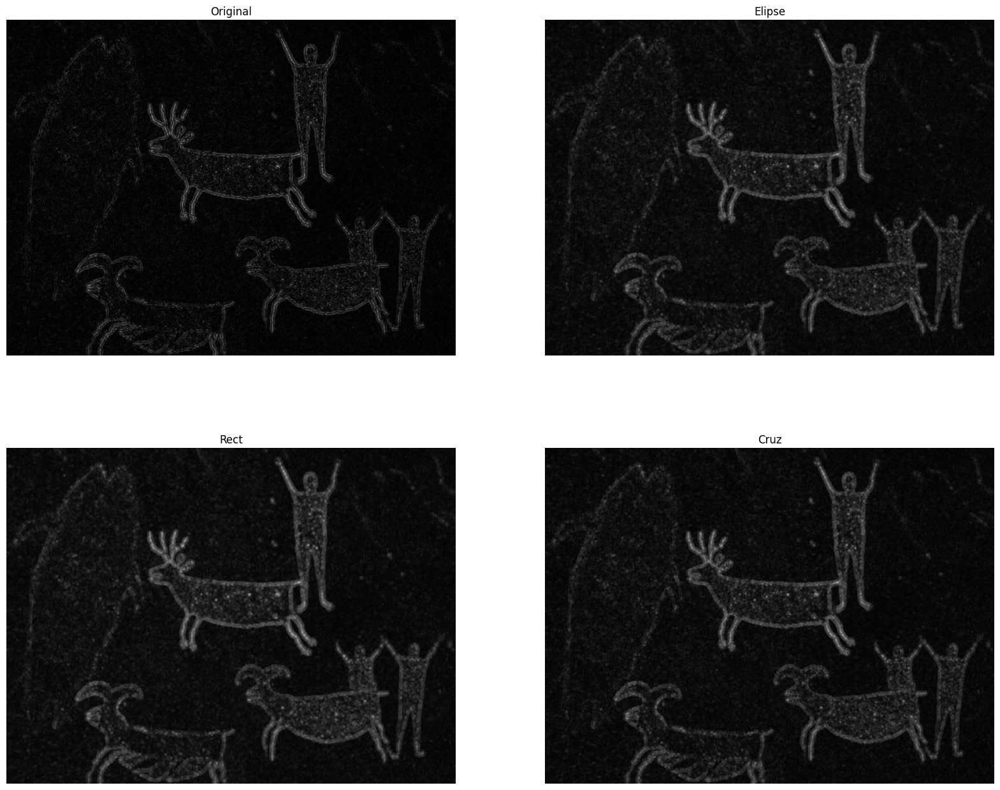

Kernel Size (5, 5)


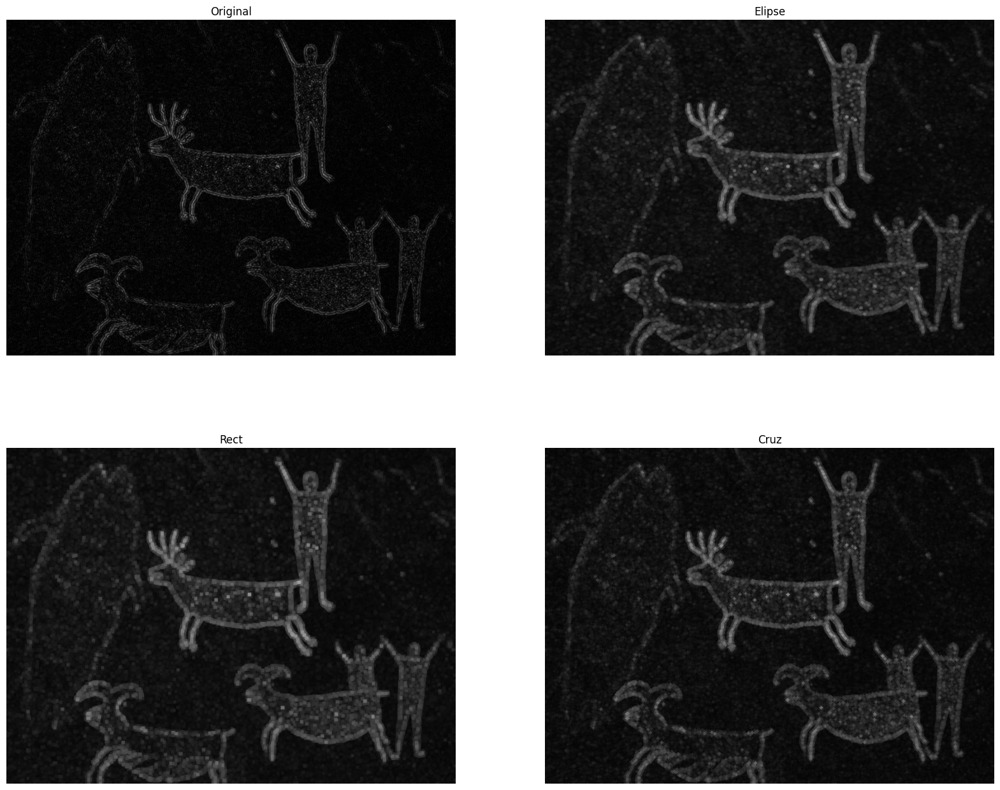

Kernel Size (7, 7)


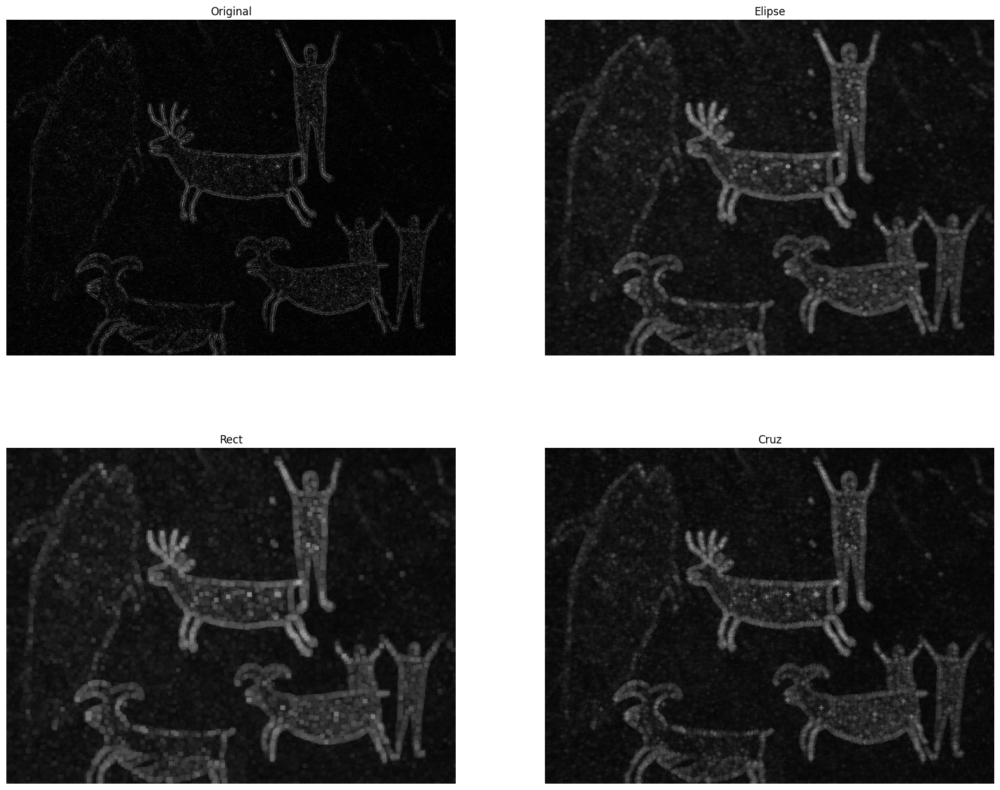

Kernel Size (9, 9)


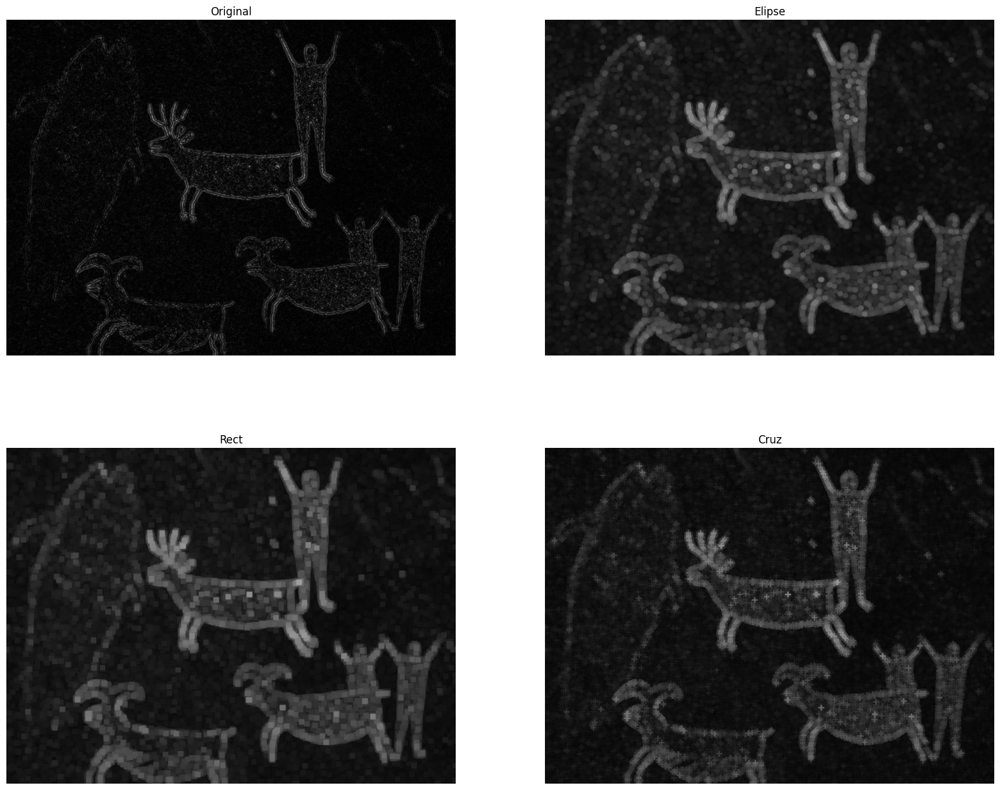

Kernel Size (11, 11)


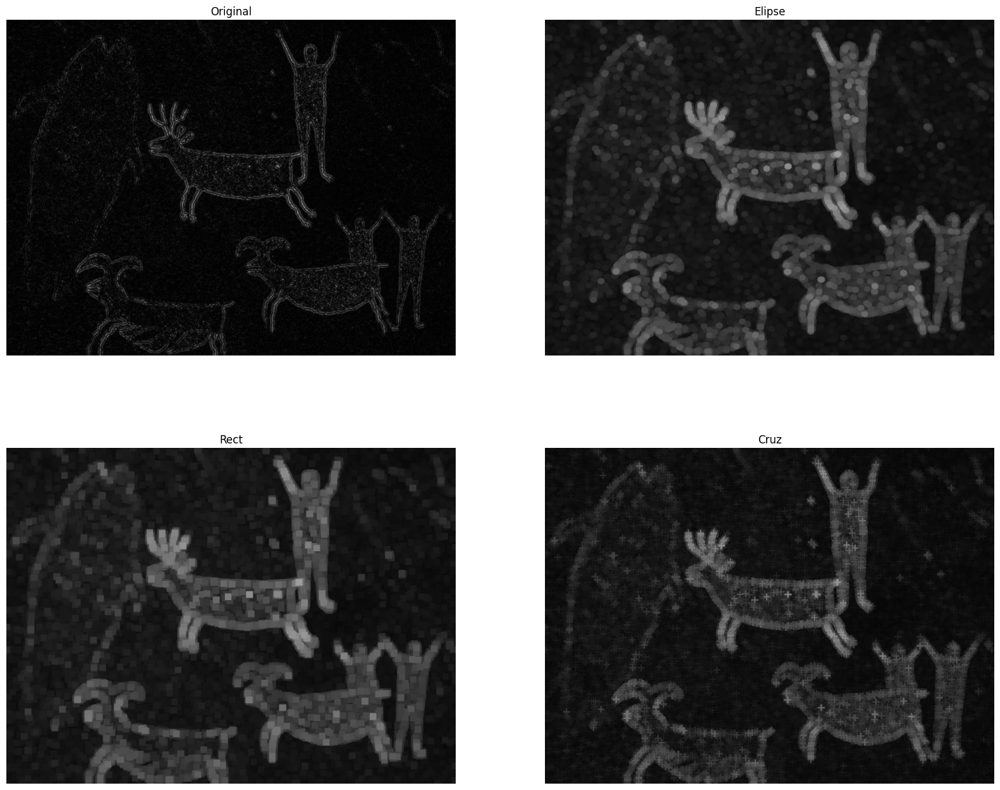

In [11]:
for ker in kernelSize:
    img = img_laplaciano
    kernel1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,ker)
    img_dilat_elipse = cv2.dilate(img, kernel1, iterations=1)
    
    kernel2 = cv2.getStructuringElement(cv2.MORPH_RECT,ker)
    img_dilat_rect = cv2.dilate(img, kernel2, iterations=1)
    
    kernel3 = cv2.getStructuringElement(cv2.MORPH_CROSS,ker)
    img_dilat_cross = cv2.dilate(img, kernel3, iterations=1)
    
    imgs_processadas = [img_laplaciano, img_dilat_elipse, img_dilat_rect, img_dilat_cross]
    labels = ['Original', 'Elipse', 'Rect', 'Cruz']    
    plt.figure(figsize=(20,16))
    print(f'Kernel Size {ker}')
    for j in range(0, 4):
        plt.subplot(2, 2, j+1)
        plt.axis('off')
        plt.title(labels[j])
        img = cv2.cvtColor(imgs_processadas[j], cv2.COLOR_BGR2RGB)
        plt.imshow(img)
    plt.show()

# Erosão

Kernel Size (3, 3)


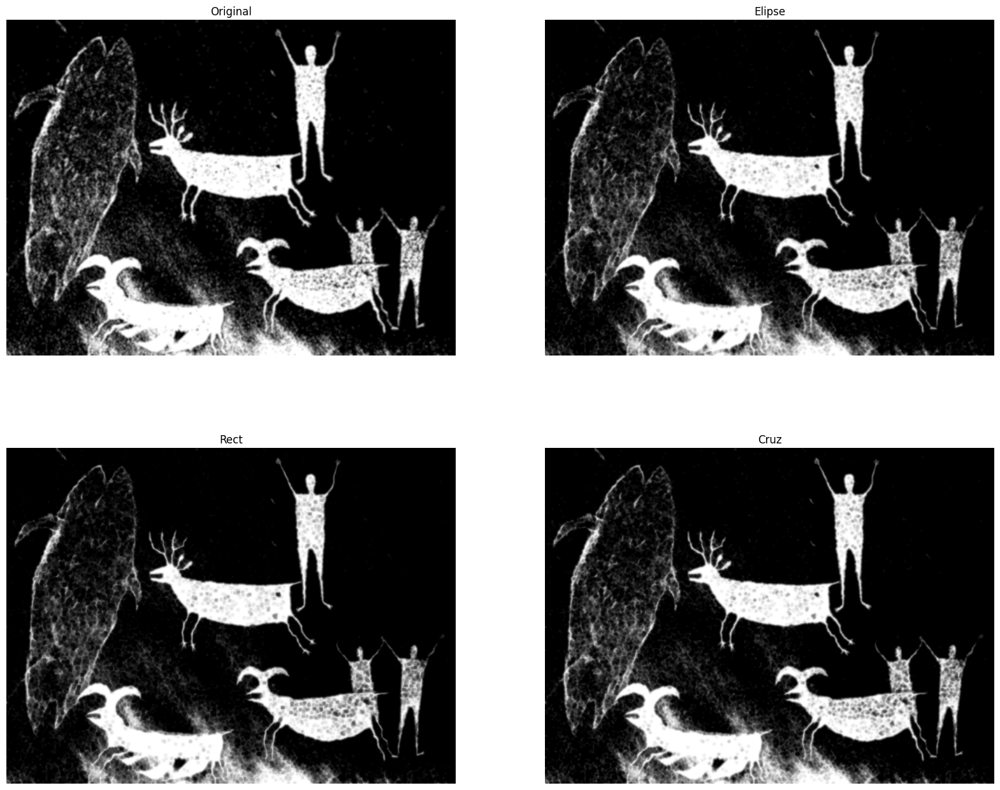

Kernel Size (5, 5)


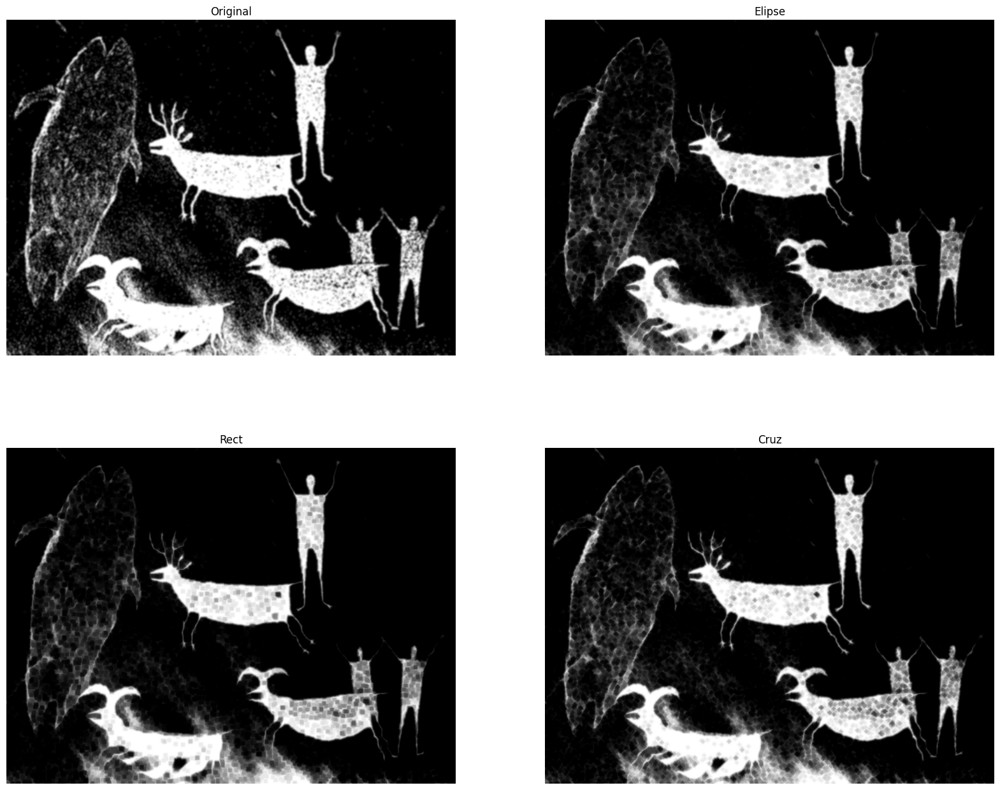

Kernel Size (7, 7)


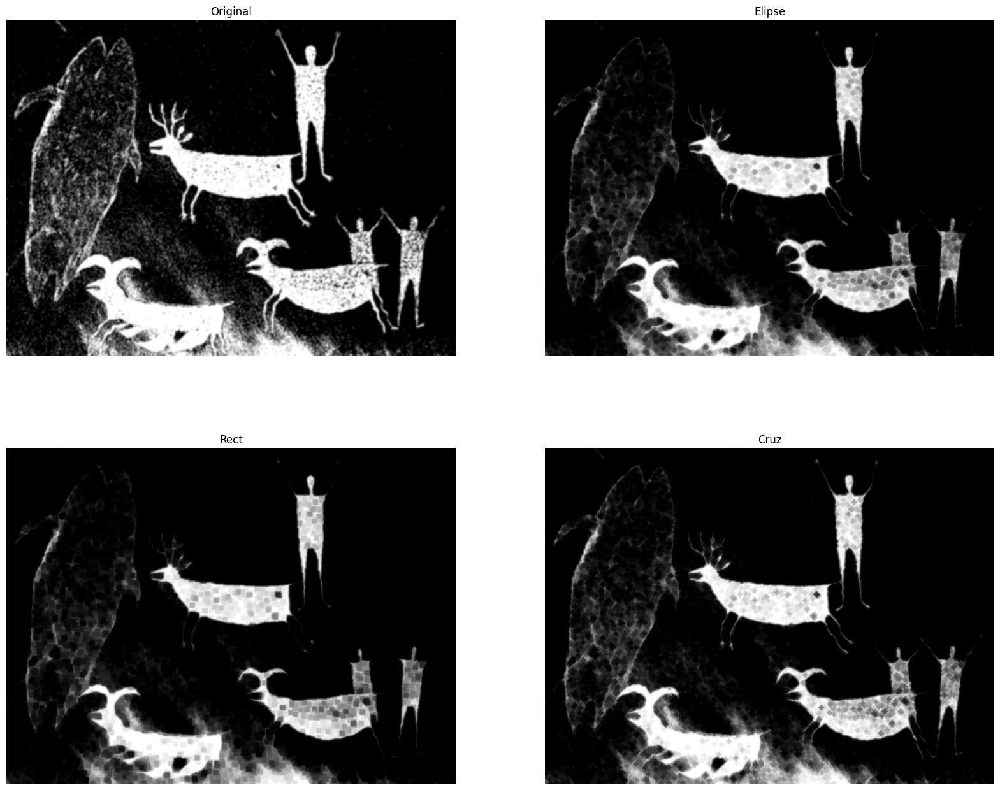

Kernel Size (9, 9)


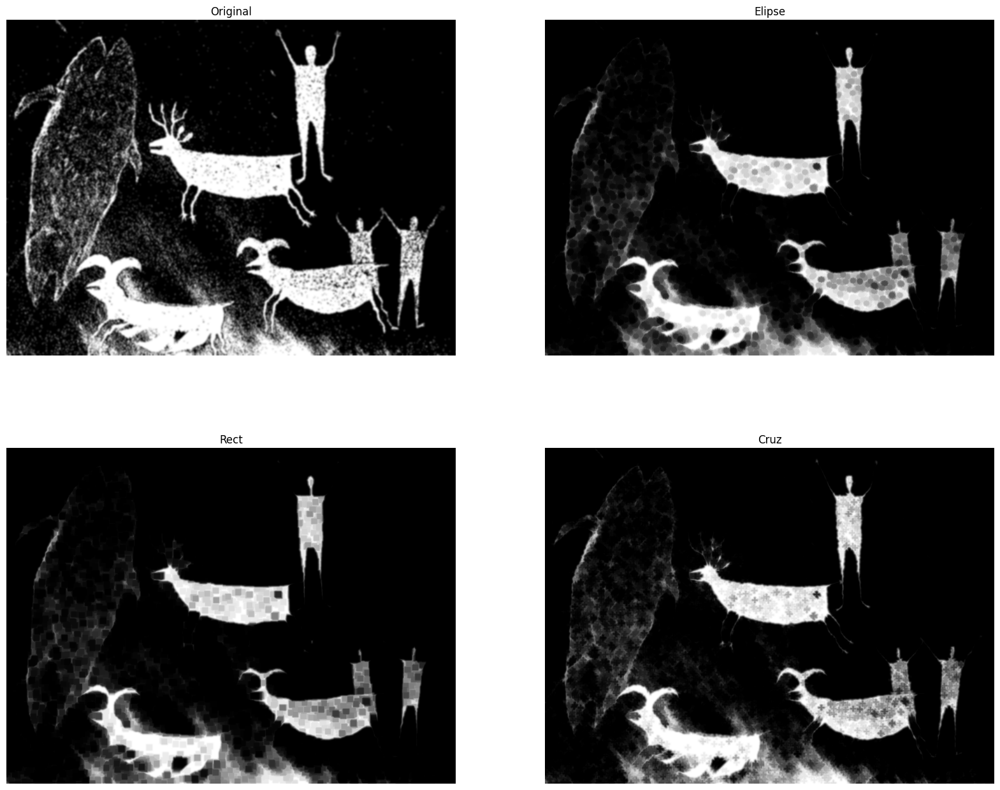

Kernel Size (11, 11)


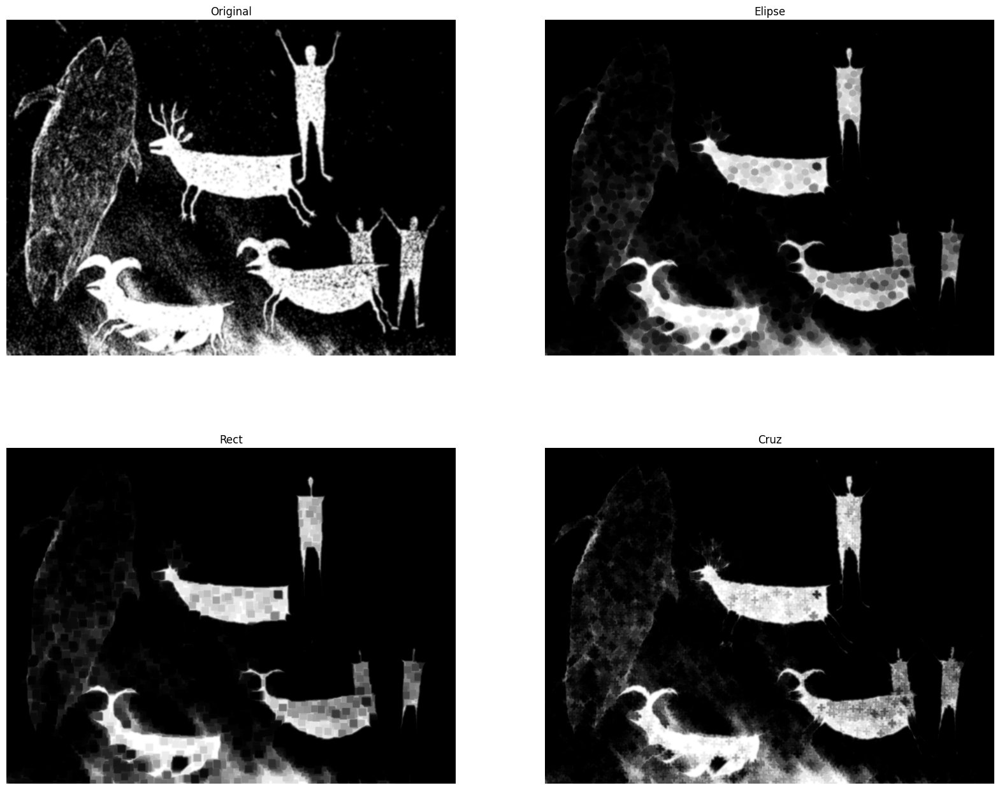

In [12]:
kernelSize = [(3,3), (5,5), (7,7), (9,9), (11,11)] #Dimensão do kernel
for ker in kernelSize:
    ret, imagBin = cv2.threshold(img_gray,0,255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
    imagBin = cv2.GaussianBlur(imagBin, (7,7), 0)
    img = imagBin
    
    kernel1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ker)
    img_erode_elipse = cv2.erode(img, kernel1, iterations=1)
    
    kernel2 = cv2.getStructuringElement(cv2.MORPH_RECT,ker)
    img_erode_rect = cv2.erode(img, kernel2, iterations=1)
    
    kernel3 = cv2.getStructuringElement(cv2.MORPH_CROSS,ker)
    img_erode_cross = cv2.erode(img, kernel3, iterations=1)
    
    imgs_processadas = [img, img_erode_elipse, img_erode_rect, img_erode_cross]
    labels = ['Original', 'Elipse', 'Rect', 'Cruz']    
    plt.figure(figsize=(20,16))
    print(f'Kernel Size {ker}')
    for j in range(0, 4):
        plt.subplot(2, 2, j+1)
        plt.axis('off')
        plt.title(labels[j])
        img = cv2.cvtColor(imgs_processadas[j], cv2.COLOR_BGR2RGB)
        plt.imshow(img)
    plt.show()

# Preenchimento

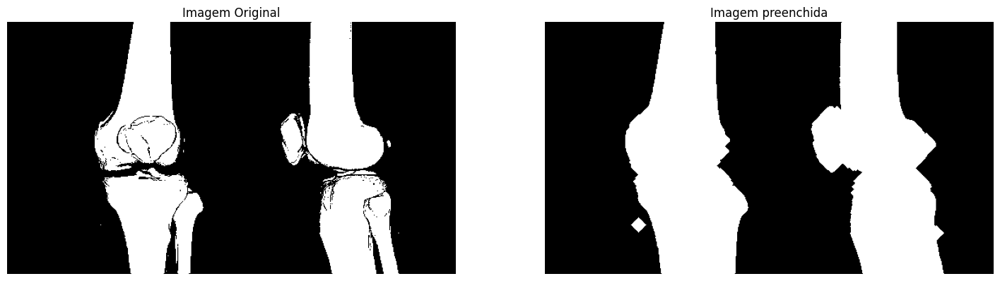

In [13]:
img_moedas = cv2.imread(imgs_list[4], 0)
ret, moedas = cv2.threshold(img_moedas,0,255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
src = moedas
kernel1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
img_dilat_elipse = cv2.dilate(src, kernel1, iterations=9)

plt.figure(figsize=(18,15))
plt.subplot(2, 2, 1)
plt.title('Imagem Original')
plt.axis('off')
plt.imshow(src, cmap='gray')

plt.subplot(2, 2, 2)
plt.title('Imagem preenchida')
plt.axis('off')
plt.imshow(img_dilat_elipse, cmap='gray')

# Deteccao de bordas

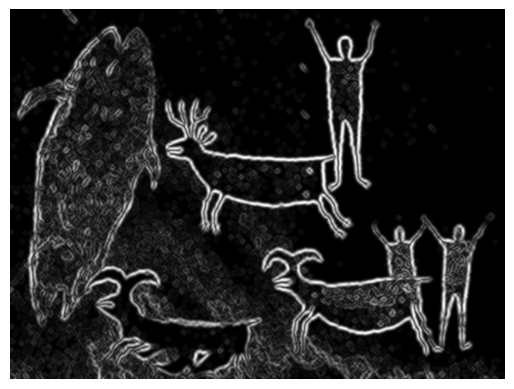

In [14]:
kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (5,5))
src = cv2.GaussianBlur(imagBin, (7,7), 0)

img_dilat_cross = cv2.dilate(src, kernel, iterations=1)    
img_erode_cross = cv2.erode(src, kernel, iterations=1)
img = img_dilat_cross - img_erode_cross
plt.axis('off')
plt.imshow(img, cmap='gray')

# Abertura

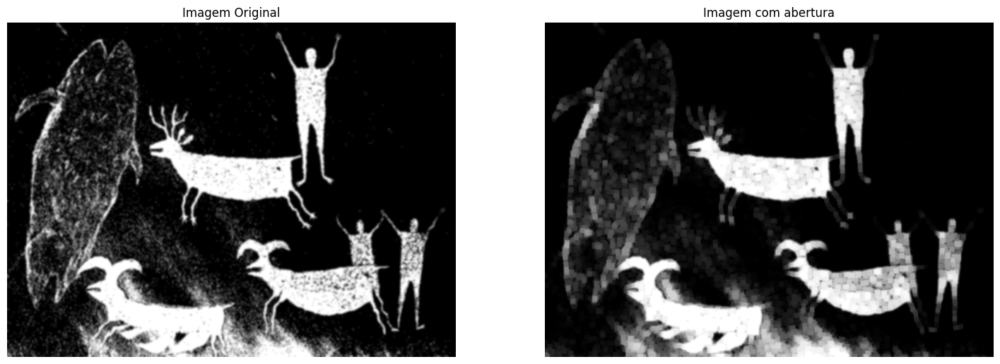

In [30]:
img = imagBin
img = cv2.GaussianBlur(img, (3,3), 0)
kernelSize = (7,7)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernelSize)
opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

plt.figure(figsize=(18,15))
plt.subplot(2, 2, 1)
plt.axis('off')
plt.title('Imagem Original')
plt.imshow(img, cmap='gray')

plt.subplot(2, 2, 2)
plt.title('Imagem com abertura')
plt.axis('off')
plt.imshow(opening, cmap='gray')

# Fechamento

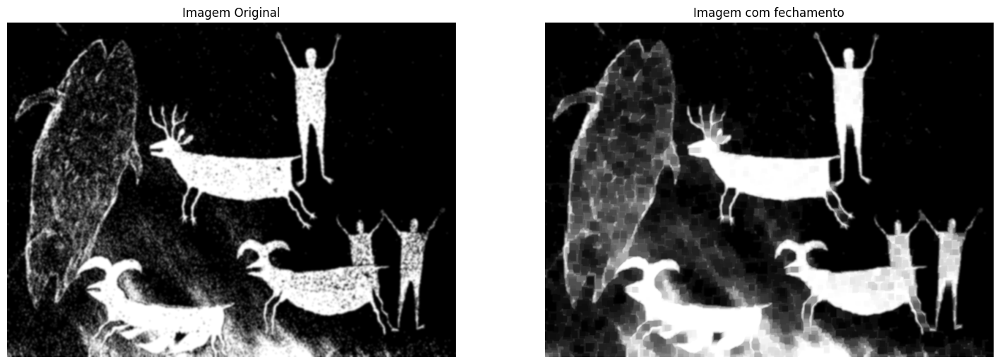

In [28]:
img = imagBin
img = cv2.GaussianBlur(img, (3,3), 0)
kernelSize = (9,9)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernelSize)
closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)


plt.figure(figsize=(18,15))
plt.subplot(2, 2, 1)
plt.title('Imagem Original')
plt.axis('off')
plt.imshow(img, cmap='gray')

plt.subplot(2, 2, 2)
plt.title('Imagem com fechamento')
plt.axis('off')
plt.imshow(closing, cmap='gray')